# Shape Features based on CellCharter
The `CellCharter` package provides metrics to characterize shapes in 2D. A shape is a connected component of points (cells), that is enclosed by an alpha shape (similar to a convex hull, but fitting the point cloud more tightly). In the CellCharter [publication](https://www.nature.com/articles/s41588-023-01588-4) and [documentation](https://cellcharter.readthedocs.io/en/latest/index.html), the shape features are used to describe cells of the same niche that group together in space, e.g., tightly packed tumor cells.

Since CellCharter was developed with conventional 2D images in mind, the functions to characterize shapes cannot process 3D point distributions. In this notebook, we first explore the 2D shape characterizations, then extend the implementation to 3D shapes.

In [1]:
# Run this cell when making changes to editable packages
# i.e., when developing/testing the new implementations
%load_ext autoreload
%autoreload 2

In [ ]:
## Imports
import cellcharter as cc # imported as submodule
import alphashape # imported as submodule
import trimesh # must be v4.2.0 or lower for alphashape compatibility
from skimage.morphology import skeletonize
import networkx as nx
import sknw
from cellcharter.tl._shape import _find_longest_simple_path, _prune_graph, _curl_3D_skeleton
from scipy.stats import pearsonr
from sklearn.preprocessing import scale
from sklearn.decomposition import PCA
import anndata as ad
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import time
import pickle

/home/gesa/.py_venv/cellcharter/lib/python3.12/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(


## Shape Characterization in 2D

Suitable parameter values should be chosen based on the data and research hypothesis. Here, we will use an exemplary 2D image to test a range of values.

In [3]:
## Load small example data
# contains one 2D section with 4 niches
# as described in niches_cellcharter.ipynb
adata2_test = ad.read_zarr('../../data/shape_features/adata2_test.zarr')

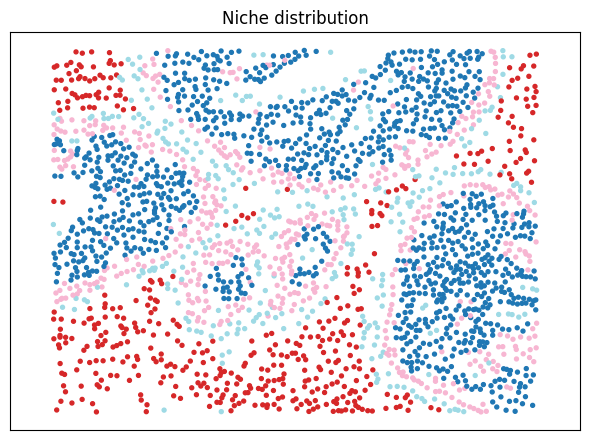

/home/gesa/.py_venv/cellcharter/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:777: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


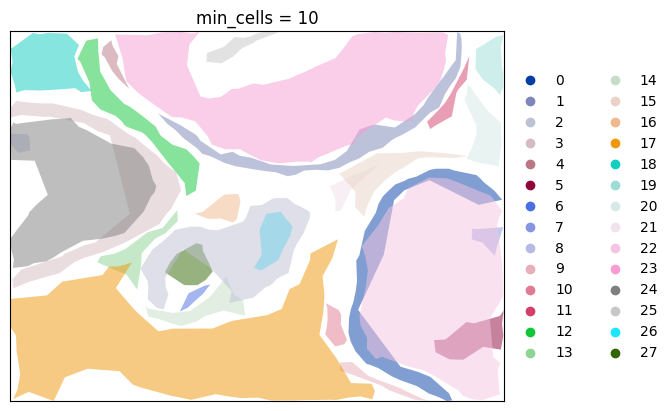

/home/gesa/.py_venv/cellcharter/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:777: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


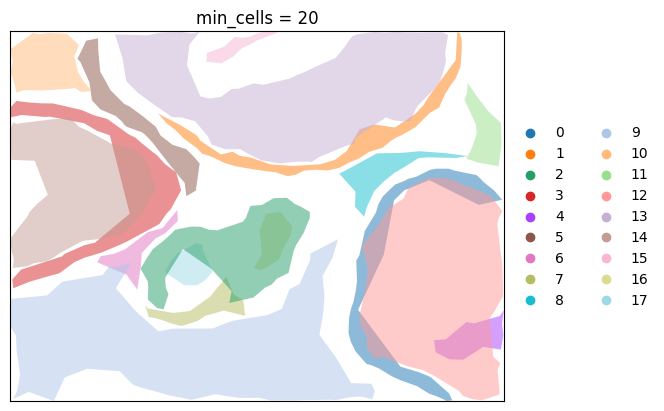

/home/gesa/.py_venv/cellcharter/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:777: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


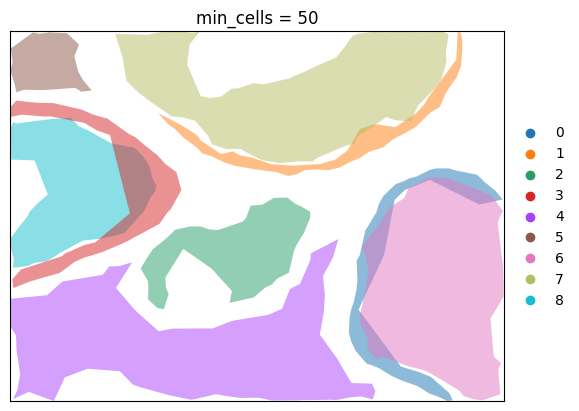

In [4]:
## Try boundary params: min_cells
min_cells_list = [10,20,50] ## Minimum number of cells in a connected component

# Plot niche assignments for comparison
adata = adata2_test.copy() # temporary copy
color = adata.obs['niche'].astype('category')
plt.subplots(figsize=(6,4.5))
plt.title('Niche distribution')
plt.scatter(adata.obsm['spatial'][:,0], 
            adata.obsm['spatial'][:,1] * (-1), ## flip y-axis, as in boundary plot
            c=color,
            cmap = plt.get_cmap('tab20', np.unique(color).shape[0]), 
            s=8)
plt.xticks([])
plt.yticks([])
plt.axis('equal')
plt.tight_layout()
plt.show()

for min_cells in min_cells_list:
    # Identify connected components
    cc.gr.connected_components(adata, cluster_key='niche', out_key=f'component_{min_cells}cells', min_cells=min_cells)

    # Generate boundary around each connected component, excluding holes
    cc.tl.boundaries(adata, cluster_key=f'component_{min_cells}cells', alpha_start=30)

    # Plot boundaries
    cc.pl.boundaries(adata,
                    library_key='z',
                    sample=42,
                    component_key = f'component_{min_cells}cells',
                    alpha_boundary=0.5,
                    show_cells=False)
    plt.xticks([])
    plt.yticks([])
    plt.title(f'min_cells = {min_cells}')
    plt.show()

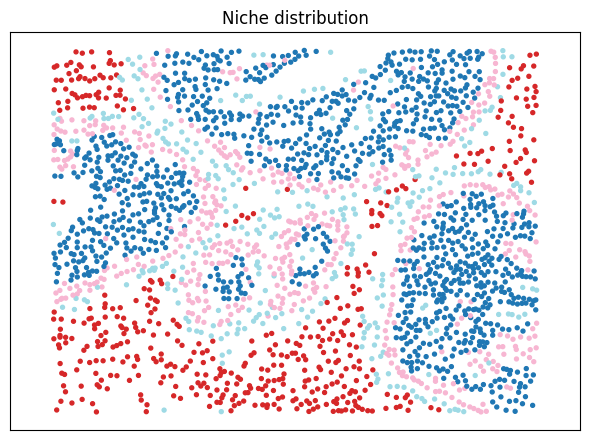

/home/gesa/.py_venv/cellcharter/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:777: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


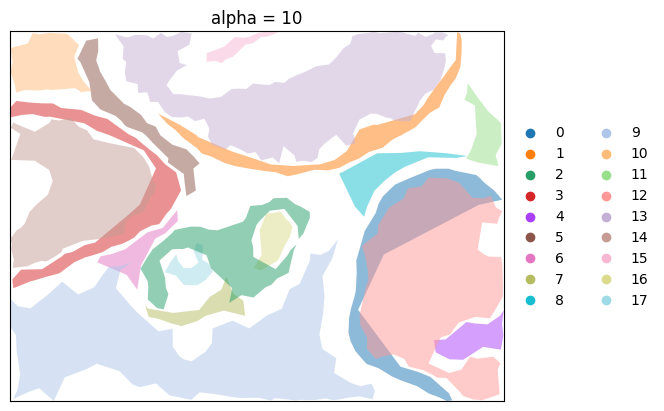

/home/gesa/.py_venv/cellcharter/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:777: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


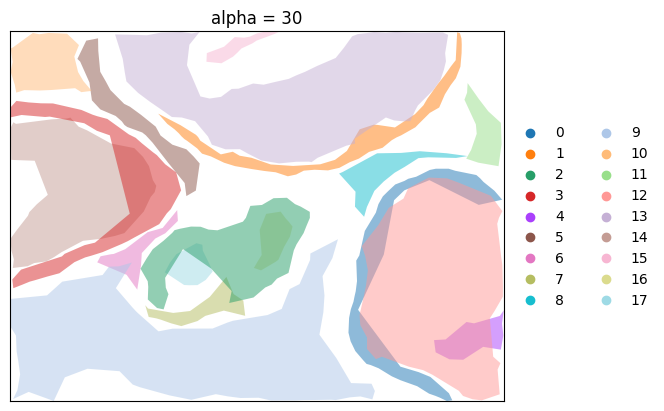

/home/gesa/.py_venv/cellcharter/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:777: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


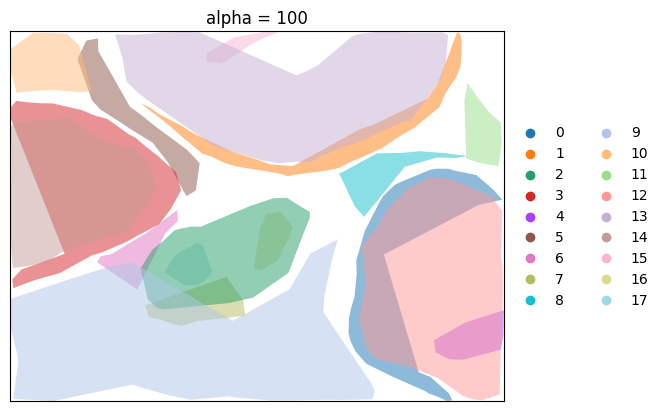

In [5]:
## Try boundary params: alpha
alphas = [10,30,100]

# Plot niche assignments for comparison
adata = adata2_test.copy() # temporary copy
color = adata.obs['niche'].astype('category')
plt.subplots(figsize=(6,4.5))
plt.title('Niche distribution')
plt.scatter(adata.obsm['spatial'][:,0], 
            adata.obsm['spatial'][:,1] * (-1), ## flip y-axis, as in boundary plot
            c=color,
            cmap = plt.get_cmap('tab20', np.unique(color).shape[0]), 
            s=8)
plt.xticks([])
plt.yticks([])
plt.axis('equal')
plt.tight_layout()
plt.show()

# Identify connected components
cc.gr.connected_components(adata, cluster_key='niche', out_key='component', min_cells=20)

for alpha in alphas:    
    # Generate boundary around each connected component, excluding holes
    cc.tl.boundaries(adata, cluster_key='component', alpha_start=alpha)

    # Plot boundaries
    cc.pl.boundaries(adata,
                    library_key='z',
                    sample=42,
                    component_key = 'component',
                    alpha_boundary=0.5,
                    show_cells=False)
    plt.xticks([])
    plt.yticks([])
    plt.title(f'alpha = {alpha}')
    plt.show()

In [6]:
## Assess shape features with chosen parameters
# Identify connected components
cc.gr.connected_components(adata2_test, cluster_key='niche', out_key='component', min_cells=20)

# Generate boundary around each connected component, excluding holes
cc.tl.boundaries(adata2_test, cluster_key='component', alpha_start=30)

boundaries = {
    cluster: boundary
    for cluster, boundary in adata.uns["shape_component"]["boundary"].items()
    if cluster in adata2_test.obs['component'].unique()
}

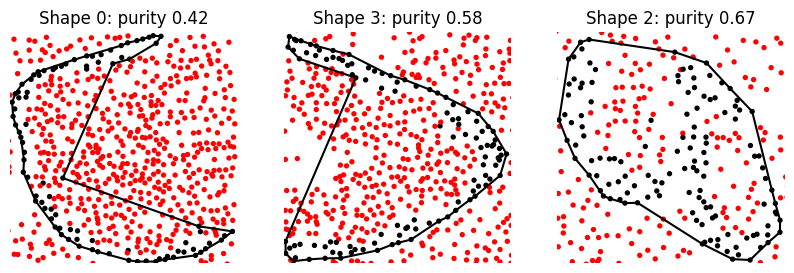

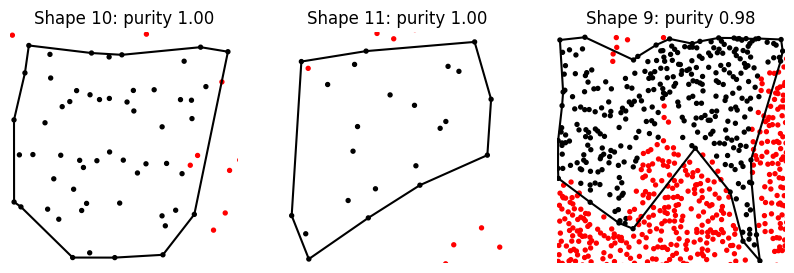

In [7]:
## Plot shapes with min/max purity values
cc.tl.purity(adata2_test, library_key='z', cluster_key='component', exterior=False)

# Define plot parameters
rcparams_shape = {
    'image.aspect': 'equal',  
    'axes.spines.left': False,
    'axes.spines.right': False,
    'axes.spines.top': False,
    'axes.spines.bottom': False
}

# Get & sort purity values
purity = adata2_test.uns['shape_component']['purity']
purity = sorted(purity.items(), key=lambda x: x[1], reverse=False) # lowest purity first

for l in [purity[:3], purity[::-1][:3]]:
    with mpl.rc_context(rcparams_shape):
        fig, ax = plt.subplots(1, 3, figsize=(10, 3))
        for i, (key, value) in enumerate(l):
            polygon = boundaries[key]
            exterior = np.array(polygon.exterior.xy)
            
            ax[i].plot(exterior[0], exterior[1], color='black') # alpha shape
            if len( polygon.interiors ):
                for i in len( polygon.interiors ):
                    interior = np.array(polygon.interiors[i].xy)
                    ax[i].plot(interior[0], interior[1], color='black')
            ax[i].scatter(adata2_test.obsm['spatial'][:,0], # cells
                        adata2_test.obsm['spatial'][:,1],
                        c=adata2_test.obs['component']==key,
                        cmap='flag',
                        s=8)
            ax[i].set_xlim(exterior[0].min()-2, exterior[0].max()+5)
            ax[i].set_ylim(exterior[1].min()-2, exterior[1].max()+5)
            ax[i].set_xticks([])
            ax[i].set_yticks([])
            ax[i].set_title(f'Shape {key}: purity {value:.2f}')
        plt.show()

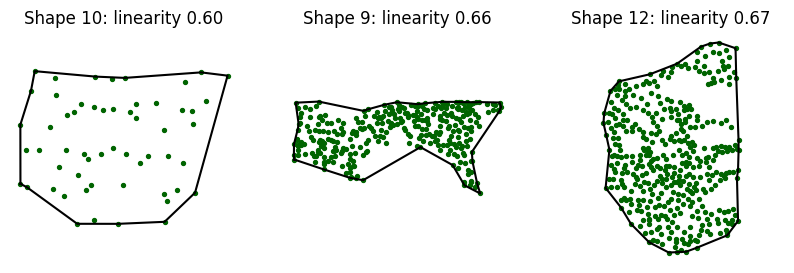

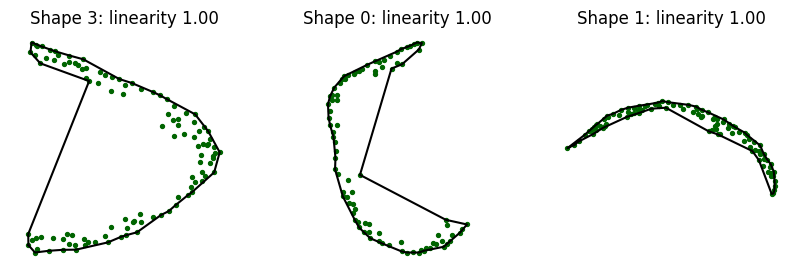

In [8]:
## Plot shapes with min/max linearity values
height = 1000 # Height of the rasterized image (higher = more precise = more computation)
min_ratio = 0.05 # Minimum ratio between the length of a branch and the total length of the skeleton to be considered a real branch and not be removed

cc.tl.linearity(adata2_test, cluster_key='component', height=height, min_ratio=min_ratio)
linearity = adata2_test.uns['shape_component']['linearity'].items()
linearity = sorted(linearity, key = lambda x: x[1])

for l in [linearity[:3], linearity[::-1][:3]]:
    with mpl.rc_context(rcparams_shape):
        fig, ax = plt.subplots(1, 3, figsize=(10, 3))
        for i, (key, value) in enumerate(l):
            polygon = boundaries[key]
            exterior = np.array(polygon.exterior.xy) # alpha shape
            pts = adata2_test.obsm['spatial'][ adata2_test.obs['component']==key, :] # cells
            
            ax[i].axis('equal')
            ax[i].plot(exterior[0], exterior[1], color='black') # alpha shape
            ax[i].scatter(pts[:,0], pts[:,1], color='darkgreen', s=8) # cells
            ax[i].set_xticks([])
            ax[i].set_yticks([])
            ax[i].set_title(f'Shape {key}: linearity {value:.2f}')
        plt.show()

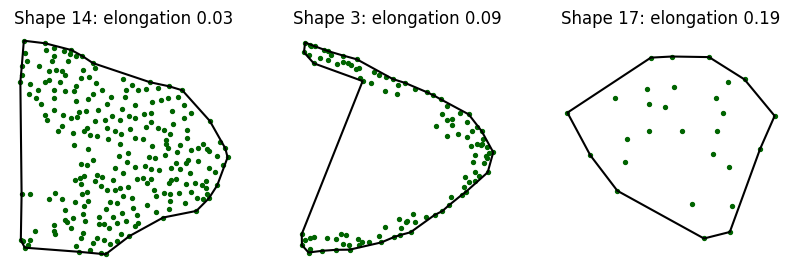

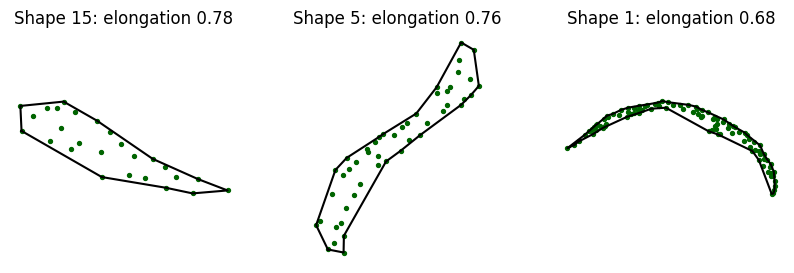

In [9]:
## Plot shapes with min/max elongation values
cc.tl.elongation(adata2_test, cluster_key='component')
elongation = adata2_test.uns['shape_component']['elongation']
elongation = sorted(elongation.items(), key = lambda x: x[1])

for l in [elongation[:3], elongation[::-1][:3]]:
    with mpl.rc_context(rcparams_shape):
        fig, ax = plt.subplots(1, 3, figsize=(10, 3))
        for i, (key, value) in enumerate(l):
            polygon = boundaries[key]
            exterior = np.array(polygon.exterior.xy) # alpha shape
            pts = adata2_test.obsm['spatial'][ adata2_test.obs['component']==key, :] # cells
            
            ax[i].axis('equal')
            ax[i].plot(exterior[0], exterior[1], color='black') # alpha shape
            ax[i].scatter(pts[:,0], pts[:,1], color='darkgreen', s=8) # cells
            ax[i].set_xticks([])
            ax[i].set_yticks([])
            ax[i].set_title(f'Shape {key}: elongation {value:.2f}')
        plt.show()

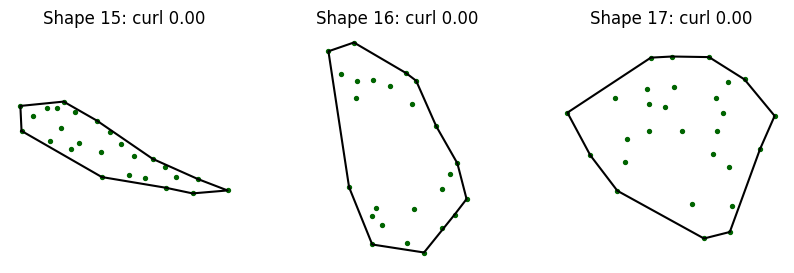

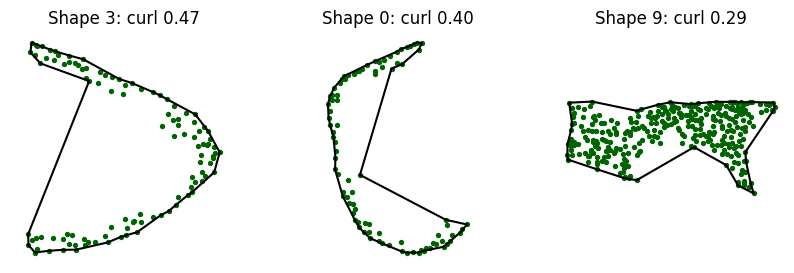

In [10]:
## Plot shapes with min/max curl values
cc.tl.curl(adata2_test, cluster_key='component')
curl = adata2_test.uns['shape_component']['curl']
curl = sorted(curl.items(), key = lambda x: x[1])

for l in [curl[:3], curl[::-1][:3]]:
    with mpl.rc_context(rcparams_shape):
        fig, ax = plt.subplots(1, 3, figsize=(10, 3))
        for i, (key, value) in enumerate(l):
            polygon = boundaries[key]
            exterior = np.array(polygon.exterior.xy) # alpha shape
            pts = adata2_test.obsm['spatial'][ adata2_test.obs['component']==key, :] # cells
            
            ax[i].axis('equal')
            ax[i].plot(exterior[0], exterior[1], color='black') # alpha shape
            ax[i].scatter(pts[:,0], pts[:,1], color='darkgreen', s=8) # cells
            ax[i].set_xticks([])
            ax[i].set_yticks([])
            ax[i].set_title(f'Shape {key}: curl {value:.2f}')
        plt.show()

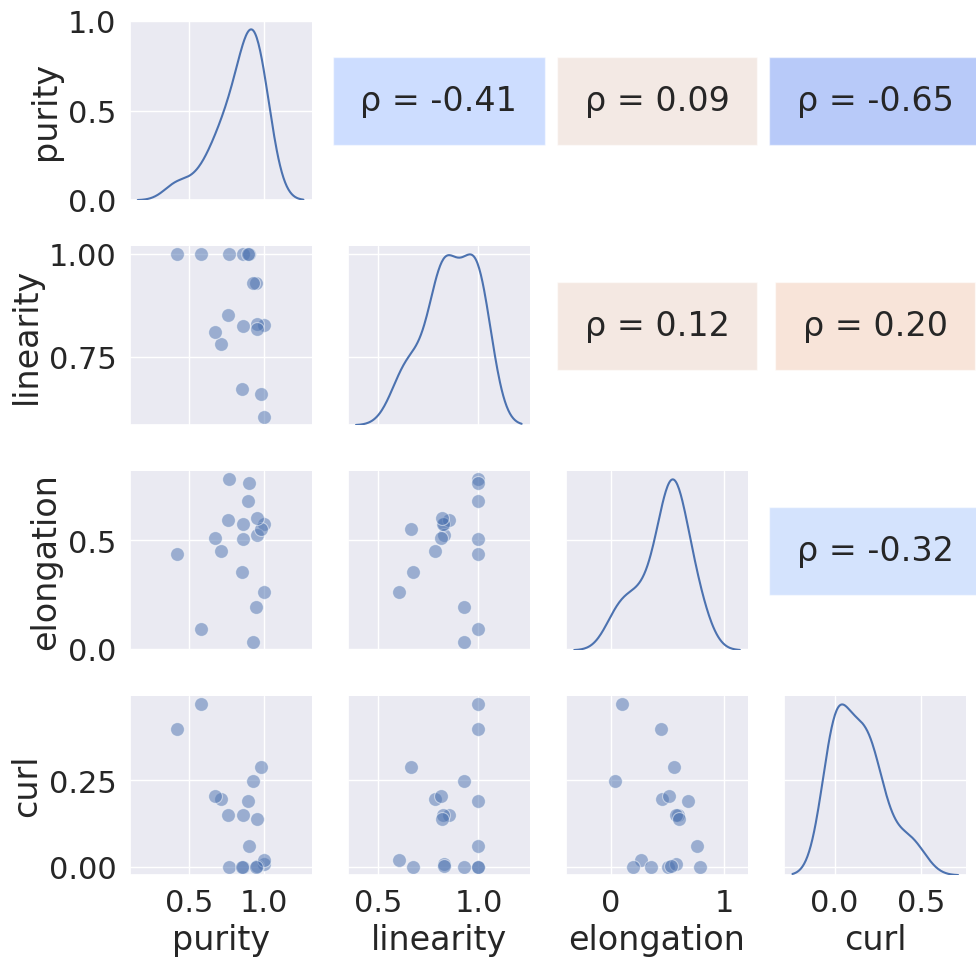

In [11]:
## Plot distribution & correlation of shape features
# Features to df
keys = adata2_test.uns['shape_component']['boundary'].keys()
shape_features = [ key for key in adata2_test.uns['shape_component'].keys() if not key=='boundary']
shape_df = pd.DataFrame(index=keys)
for score in shape_features:
    shape_df[score] = [ adata2_test.uns['shape_component'][score][key] for key in keys ]

# Plot
def corrfunc(x, y, cmap, **kws):
    r, _ = pearsonr(x, y)
    ax = plt.gca()
    norm = plt.Normalize(-1, 1)
    ax.annotate("ρ = {:.2f}".format(r),
                xy=(0.5, 0.5), xycoords='axes fraction', ha='center',
                bbox={'facecolor': cmap(norm(r)), 'alpha': 0.5, 'pad': 20},
                )
    ax.set_axis_off()
cmap = plt.get_cmap('coolwarm')

sns.set(font_scale=2)
pg = sns.PairGrid(shape_df,
                  diag_sharey=False)
pg.map_upper(corrfunc, cmap=cmap)
pg.map_lower(sns.scatterplot, s=100, alpha=.5)
pg.map_diag(sns.kdeplot)
plt.show()
sns.reset_defaults()

## Shape Characterization in 3D
Note that shapes are visualized as interactive plots in the python notebook using the trimesh library, which cannot be displayed in web versions (e.g., on GitHub).

### Function implementation & assessment of function parameters

In [22]:
## Load small example data
# contains a thin 3D section with 4 niches
adata3_test = ad.read_zarr('../../data/shape_features/adata3_test0.zarr')

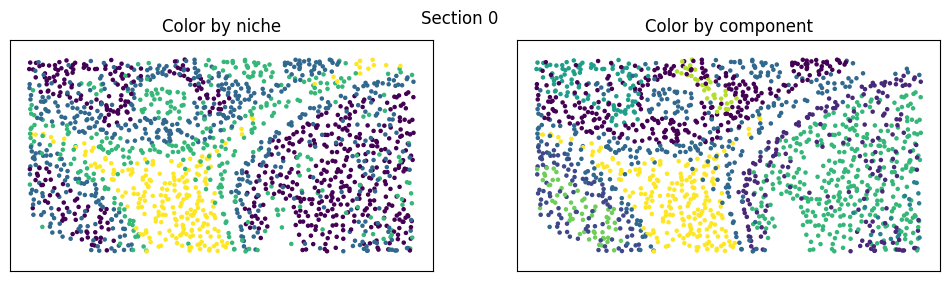

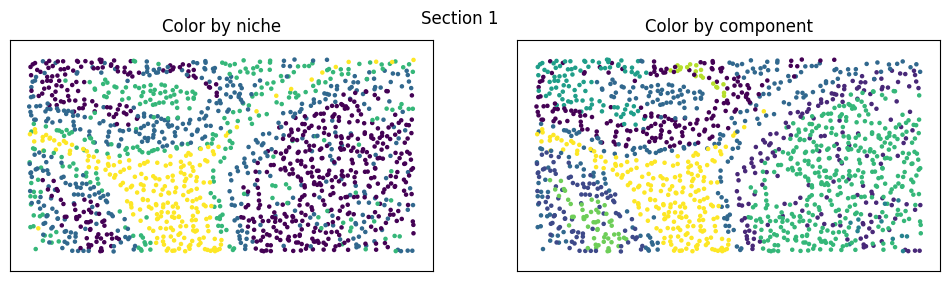

In [23]:
## Identify connected components
min_cells = 30 ## Minimum number of cells in a connected component
cc.gr.connected_components(adata3_test, cluster_key='niche', out_key='component', min_cells=min_cells)

# Plot (divided into 2 sections to avoid overplotting)
pts = adata3_test.obsm['spatial']
section_size = 15
for j in range(int( pts[:,2].max() // section_size )):
    cond = (pts[:,2] >= section_size*j) & (pts[:,2] <= section_size*(j+1))
    fig, ax = plt.subplots(1,2, figsize=(12,3))
    ax[0].set_title('Color by niche')
    ax[0].scatter(pts[ cond, 0],
                pts[ cond, 1],
                c=adata3_test.obs.loc[cond, 'niche'],
                s=5)
    ax[1].set_title('Color by component')
    ax[1].scatter(pts[ cond, 0],
                pts[ cond, 1],
                c=adata3_test.obs.loc[cond, 'component'],
                s=5)
    for i in range(2):
        ax[i].axis('equal')
        ax[i].set_xticks([])
        ax[i].set_yticks([])
    plt.suptitle(f'Section {j}')
    plt.show()

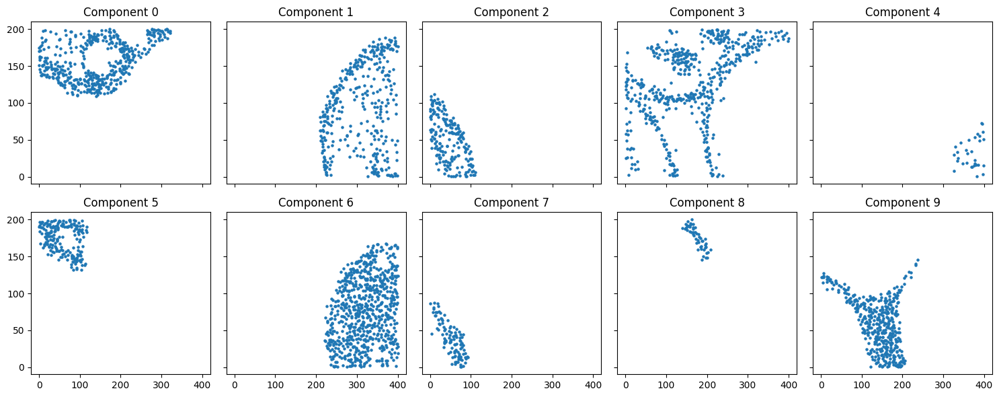

In [24]:
## Facet plot of components
pts = adata3_test.obsm['spatial']
components = adata3_test.obs['component'].unique().categories

n = components.size
n_cols = 5
n_rows = np.ceil(n / n_cols).astype(int)
fig, ax = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3), sharex=True, sharey=True)
for i in range(n_rows):
    for j in range(n_cols):
        if i*n_cols + j >= n:
            break
        cond = adata3_test.obs['component'] == components[i*n_cols + j]
        ax[i,j].scatter(pts[ cond, 0], pts[ cond, 1], s=5)
        ax[i,j].set_title(f'Component {components[i*n_cols + j]}')
plt.tight_layout()
plt.show()

### Alpha shape creation (boundary)
The function `cellcharter.tl.boundary` is only implemented for 2D data. Since it is based on manual calculation of the boundary (alpha shape) and works with `shapely` objects, which are (mostly) 3D incompatible, a full 3D-compatible implementation is necessary.

As in 2D, we want to choose a suitable alpha parameter. The package `alphashape` has a function to find the minimal alpha value that still returns a valid shape. I added the function `cellcharter.tl.alphashape_optimize`, that returns this minimal alpha and the corresponding shape (boundary), see [here](../submodules/cellcharter_3D/src/cellcharter/tl/_shape.py).

Notes:
- The function `_testalpha` of the `alphashape` package was also modified, since a valid 3D shape should be watertight.

- The parameter alpha is defined differently in the `cellcharter` and `alphashape` packages: Using the `alphashape` package, values closer to zero result in broader (less tight) shapes, with `alpha = 0` returning the concave hull (in 2D). Using `cellcharter`, the opposite is true. For clarity, we use the `cellcharter` definition and pass the inverse to `alphashape` functions.

- In the original CellCharter implementation, if the `boundary` function does not return a valid object with the `alpha_start` parameter, the value of the alpha parameter is doubled until a valid shape is returned (which might be the convex hull at its extreme). For 3D data, at first, I just reverted to using the `alphashape.optimizealpha` function if the `alpha_shape` parameter was too small. Since this was computationally very expensive, I implemented a procedure with fewer steps: The alpha value is doubled until a valid shape is returned, then multiplied by .75 until the shape is no longer valid. The last valid shape is returned, which might have used a slightly larger alpha than would be optimal.

In [25]:
## Find optimal alpha value for exemplary shape
# The resulting alpha and shape might be slightly different than when using cellcharter.tl.boundaries
key = 9

pts = adata3_test.obsm['spatial'][ adata3_test.obs['component']==key, : ]
alpha_inv = alphashape.optimizealpha(pts)
mesh = alphashape.alphashape(pts, alpha=alpha_inv)
alpha = 1/alpha_inv if alpha_inv > 0 else 2e-308
print(f'Optimal alpha: {alpha:.2}')
mesh.show()

Optimal alpha: 6.1e+01


In [152]:
## Modify alpha value to see resulting shape
# e.g., for key 9, try alpha values:
#   9 (shape not continuous),
#   61 (optimal alpha),
#   200 (shape similar to convex hull)

key = 9 # component key
alpha = 61

pts = adata3_test.obsm['spatial'][ adata3_test.obs['component']==key, : ]
mesh = alphashape.alphashape(pts, alpha=1/alpha)
mesh.show()

alpha: 73.4


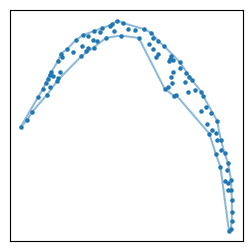

In [227]:
## The alphashape function also works on 2D data
# Though the 2D implementation in cellcharter is not changed
# to maintain backwards compatibility
key = 1
alpha, shape = cc.tl.alphashape_optimize(adata2_test[adata2_test.obs['component']==key],
                                         cluster_key='component', silent=False)
print(f'alpha: {list(alpha.values())[0]:.3}')

fig, ax = plt.subplots(figsize=(3,3))
ax.scatter(*zip(*adata2_test[ adata2_test.obs['component']==key ].obsm['spatial']), s=5)
ax.plot(*list(shape.values())[0].exterior.xy, alpha=0.5)
ax.set_xticks([])
ax.set_yticks([])
plt.show()

### Shape features

The geometric features that CellCharter uses to describe shapes only work for 2D applications. Some of the shape features, like purity, just need to be implemented to work with 3D objects. Other features, like elongation, need to be extended conceptually. Here, we will go through each of the concepts individually, demonstrating them as needed. The final implementation is found in the [CellCharter submodule](../submodules/cellcharter_3D/src/cellcharter/tl/_shape.py) of this repository.

**Purity**: "Ratio between the number of cells of the cluster that are within the boundary and the total number of cells within the boundary" ([CellCharter documentation](https://cellcharter.readthedocs.io/en/latest/generated/cellcharter.tl.purity.html)).

The `trimesh` library has a function implemented to calculate the signed distance of a (set of) points to a mesh object. If the signed distance is positive, the point is contained within the mesh. The signed distance calculation requires the shape to be watertight, which is a necessary condition for the alphashape creation using the function implemented in the previous step.

In [ ]:
## Load test data for shape features
fn = '../../data/shape_features/adata3_test_features'    

# Load AnnData object from zarr
fn_zarr = fn + '.zarr'
adata3_test = ad.read_zarr(fn_zarr)

## Load shape components from pickle and add to adata.uns
fn_pkl = fn + '_shape_component.pkl'
with open(fn_pkl, 'rb') as f:
    shape_component = pickle.load(f)
adata3_test.uns['shape_component'] = shape_component

Purity:  0.9027027027027027


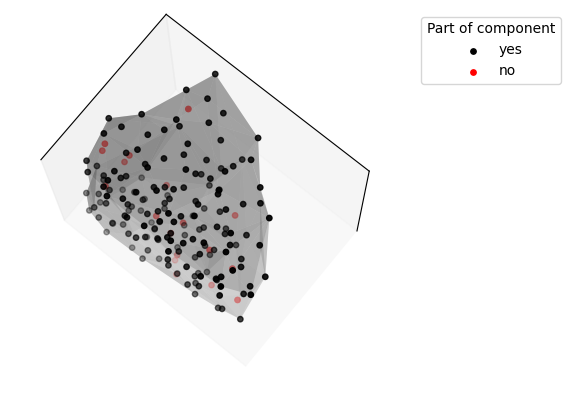

In [162]:
## Purity
# Calculate purity
mesh = adata3_test.uns['shape_component']['boundary'][1]
is_cluster = adata3_test.obs['component'] == 1
points = adata3_test.obsm['spatial']
points_cluster = points[ is_cluster, : ]
points_other = points[ ~is_cluster & mesh.contains(points), : ]

print('Purity: ', points_cluster.shape[0] / (points_cluster.shape[0] + points_other.shape[0]))


# Plot
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(projection='3d')
ax.view_init(elev=10, azim=-10, roll=140)

ax.plot_trisurf(mesh.vertices[:, 0], mesh.vertices[:,1], mesh.vertices[:,2],
                triangles=mesh.faces, alpha=.4, color='lightgray')
ax.scatter(points_cluster[:,0], points_cluster[:,1], points_cluster[:,2],
           s=15, color='black', label='yes')
ax.scatter(points_other[:,0], points_other[:,1], points_other[:,2],
           s=15, color='red', label='no')

ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])

plt.legend(title='Part of component', bbox_to_anchor=(1.05, 1), loc='upper left')

#plt.savefig('../../figures/shape_purity3D.svg', bbox_inches='tight')
plt.show()

Some shape features are very straight-forward to implement, since they rely on inbuilt functions and parameters of trimesh objects. Their definition is found below, the implementation in the submodule.

The first two rely on the oriented bounding box:

**Elongation**: $1 - l_1 / l_0$, with $l_1$ and $l_0$ as the lengths of the second longest and longest axes of the oriented bounding box.

**Flatness**:  $1 - l_2 / l_1$, with $l_2$ and $l_1$ as the lengths of the shortest and second longest axes of the oriented bounding box.

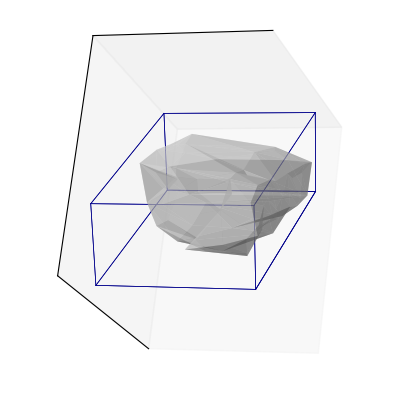

In [156]:
## Plot shape with oriented bounding box
mesh = adata3_test.uns['shape_component']['boundary'][10]

# Plot
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(projection='3d')
ax.view_init(elev=-20, azim=160, roll=90)

ax.plot_trisurf(mesh.vertices[:, 0], mesh.vertices[:,1], mesh.vertices[:,2],
                triangles=mesh.faces, alpha=.5, color='lightgray')

# Plot bounding box
bbox = mesh.bounding_box_oriented
lbf, lbb, ltf, ltb, rbf, rbb, rtf, rtb = bbox.vertices
lines = [
        [lbf, lbb], [lbf, ltf], [lbf, rbf],
        [lbb, ltb], [lbb, rbb], [lbb, lbf],
        [ltf, ltb], [ltf, rtf], [ltf, lbf],
        [ltb, rtb], [ltb, lbb], [ltb, ltf],
        [rtf, rtb], [rtf, ltf], [rtf, rbf],
        [rtb, rbb], [rtb, ltb], [rtb, rtf],
        [rbb, lbb], [rbb, rbf], [rbb, rtb],
        [rbf, lbf], [rbf, rbb], [rbf, rtf],
        [rbf, rbf], [rbf, lbf], [rbf, rbb],
]
for line in lines:
    ax.plot3D(*zip(*line), lw=.5, color='darkblue')

# Hide grid lines & axes ticks
ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])

plt.show()

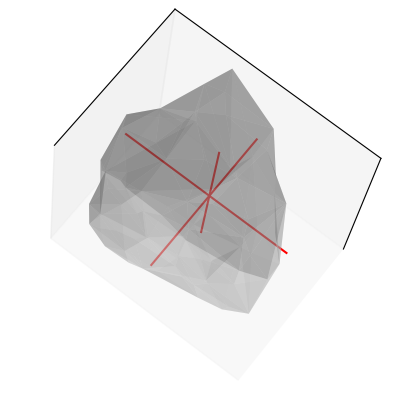

In [157]:
## Plot shape with axes
mesh = adata3_test.uns['shape_component']['boundary'][1]

bbox = mesh.bounding_box_oriented
lbf, lbb, ltf, ltb, rbf, rbb, rtf, rtb = bbox.vertices
center = np.mean(bbox.vertices, axis=0)

# Plot
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(projection='3d')
ax.view_init(elev=20, azim=-10, roll=140)

ax.plot_trisurf(mesh.vertices[:, 0], mesh.vertices[:,1], mesh.vertices[:,2],
                triangles=mesh.faces, alpha=.4, color='lightgray')
ax.plot3D([lbf[0], lbb[0]],
           np.repeat(center[1], 2),
           np.repeat(center[2], 2), color='red')
ax.plot3D(np.repeat(center[0], 2),
          [lbf[1], rbf[1]],
          np.repeat(center[2], 2), color='red')
ax.plot3D(np.repeat(center[0], 2),
          np.repeat(center[1], 2),
          [lbf[2], ltf[2]], color='red')

ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])

#plt.savefig('../../figures/shape_axes3D.svg', bbox_inches='tight')
plt.show()

Elongation: 0.81
Flatness: 0.15


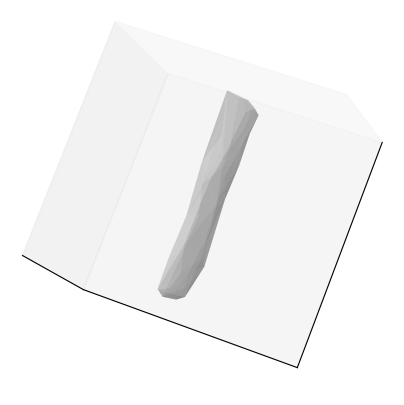

In [ ]:
## Show example of a rod shape
# -> expecting high elongation, low flatness
n = 100
m = 3
rng = np.random.default_rng(42)

# Generate a rod shape
x = np.linspace(0,3,n)
y = np.repeat(0,n)
z = np.repeat(0, n)
x1 = np.tile(x, m) + rng.normal(0, 0.1, n*m)
y1 = np.tile(y, m) + rng.normal(0, 0.1, n*m)
z1 = np.tile(z, m) + rng.normal(0, 0.1, n*m)

# Create mesh
mesh = alphashape.alphashape(np.vstack([x1, y1, z1]).T, alpha=0.5)

# Calculate elongation & flatness
bbox = mesh.bounding_box_oriented # TODO check for valid box
sides = np.array( bbox.primitive.extents )
sides.sort() # ascending
print(f'Elongation: {1 - (sides[1] / sides[2]):.2f}')
print(f'Flatness: {1 - (sides[0] / sides[1]):.2f}')

# Plot
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(projection='3d')
ax.view_init(elev=70, azim=70, roll=50)
ax.plot_trisurf(mesh.vertices[:, 0], mesh.vertices[:,1], mesh.vertices[:,2],
                triangles=mesh.faces, alpha=.4, color='lightgray') # mesh
ax.grid(False)
plt.axis('equal')
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])
plt.show()

**Sphericity** compares the area and volume of the observed shape to those of a sphere. A higher value indicates closer resemblance to a sphere.:
$$\Psi = \frac {\pi ^{\frac {1}{3}}(6V)^{\frac {2}{3}}}{A}$$


Sphericity: 0.95


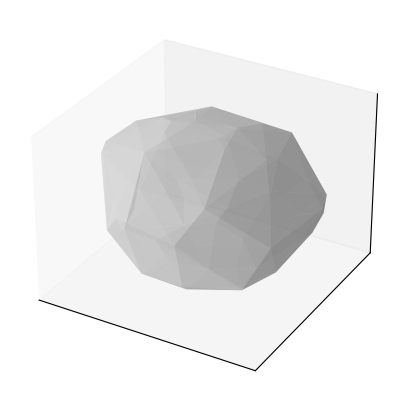

In [ ]:
# Generate toy data
n = 500
m = 3
rng = np.random.default_rng(42)

# Generate a spherical shape
theta = rng.uniform(0, 2*np.pi, n)
phi = rng.uniform(0, np.pi, n)
r = rng.uniform(0, 1, n)
x = r * np.sin(phi) * np.cos(theta)
y = r * np.sin(phi) * np.sin(theta)
z = r * np.cos(phi)
pts = np.array([x, y, z]).T
# Generate a random rotation matrix
def random_rotation_matrix():
    theta = rng.uniform(0, 2*np.pi)
    phi = rng.uniform(0, np.pi)
    psi = rng.uniform(0, 2*np.pi)
    R = np.array([[np.cos(theta)*np.cos(psi) - np.sin(theta)*np.cos(phi)*np.sin(psi),
                   -np.sin(theta)*np.cos(psi) - np.cos(theta)*np.cos(phi)*np.sin(psi),
                   np.sin(phi)*np.sin(psi)],
                  [np.cos(theta)*np.sin(psi) + np.sin(theta)*np.cos(phi)*np.cos(psi),
                   -np.sin(theta)*np.sin(psi) + np.cos(theta)*np.cos(phi)*np.cos(psi),
                   -np.sin(phi)*np.cos(psi)],
                  [np.sin(theta)*np.sin(phi),
                   np.cos(theta)*np.sin(phi),
                   np.cos(phi)]])
    return R
R = random_rotation_matrix()
# Rotate the points
pts_rotated = pts @ R.T
# Add noise & create mesh
mesh = alphashape.alphashape(pts_rotated + rng.normal(0, 0.01, pts_rotated.shape),
                             alpha=0.5)

# Calculate sphericity
print(f'Sphericity: {( (np.pi**(1/3) * ((6*mesh.volume)**(2/3))) / mesh.area ):.2f}')

# Plot
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(projection='3d')
ax.plot_trisurf(mesh.vertices[:, 0], mesh.vertices[:,1], mesh.vertices[:,2],
                triangles=mesh.faces, alpha=.4, color='lightgray') # mesh
ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])
plt.show()

Both linearity and (sometimes) curl rely on extracting a 'skeleton' from the image. The longest path of that skeleton is the longest simple path within it. Here is how this could be imagined:

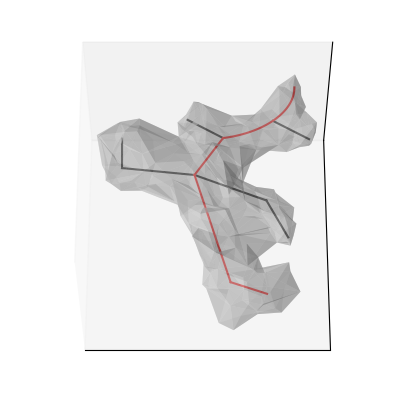

In [158]:
## Exemplify skeleton
# Define paths & outline
x0 = np.sin(np.linspace(0, .5*np.pi, 50) + .5*np.pi)
y0 = np.cos(np.linspace(0, .5*np.pi, 50) + .5*np.pi)
x1 = np.linspace(0, .5, 20) + x0[25]
y1 = np.linspace(0, -.5, 20) + y0[25]
x2 = np.linspace(0, .5, 20) - .5
y2 = np.linspace(0, -.5, 20) - .5
x3 = np.linspace(0, -.4, 20) 
y3 = np.linspace(0, -1, 20) - 1
x4 = np.linspace(0, .5, 50) + x3[-1]
y4 = np.linspace(0, -2.3, 50) + y3[-1]
x5 = np.linspace(0, .5, 20) + x4[-1]
y5 = np.linspace(0, -.3, 20) + y4[-1]
x6 = np.linspace(0, -1, 20) + x3[-1]
y6 = np.repeat(y3[-1], x6.size)
y7 = np.linspace(0, .6, 20) + y6[-1]
x7 = np.repeat(x6[-1], y7.size)
x8 = np.linspace(0, 1, 20) + x3[-1]
y8 = np.linspace(0, -.5, x8.size) + y3[-1]
x9 = np.linspace(0, .3, 20) + x8[-1]
y9 = np.linspace(0, -.8, x9.size) + y8[-1]

z0 = np.linspace(.2, 0, x0.size)
z1 = np.repeat(z0[25], x1.size)
z2 = np.repeat(z0[-1], x2.size)
z3 = np.repeat(0, x3.size)
z4 = np.linspace(0, -.3, x4.size)
z5 = np.repeat(-.3, x5.size)
z6 = np.linspace(0, .1, x6.size)
z7 = np.linspace(z6[-1], z6[-1]+.1, x7.size)
z8 = np.linspace(0, -.1, x8.size)
z9 = np.linspace(z8[-1], z8[-1]-.1, x9.size)

# Add body
rng = np.random.default_rng(42)
pts = np.tile(np.vstack([
    np.concatenate([x0,x1,x2,x3,x4,x5,x6,x7,x8,x9]),
    np.concatenate([y0,y1,y2,y3,y4,y5,y6,y7,y8,y9]),
    np.concatenate([z0,z1,z2,z3,z4,z5,z6,z7,z8,z9])]), 3).T
pts += rng.normal(0, .1, pts.shape)
pts_extra = np.tile(np.vstack([
    np.concatenate([x3,x4,x5,x6,x7]),
    np.concatenate([y3,y4,y5,y6,y7]),
    np.concatenate([z3,z4,z5,z6,z7])]), 3).T
pts_extra += rng.normal(0,.2, pts_extra.shape) # more jitter
pts = np.vstack([pts, pts_extra])

# Create shape
mesh = alphashape.alphashape(pts, alpha=3)

# Plot
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(projection='3d')
ax.view_init(elev=60, azim=-90, roll=0)
#ax.set_proj_type('persp', focal_length=0.2)  # FOV = 157.4 deg

ax.plot_trisurf(mesh.vertices[:, 0], mesh.vertices[:,1], mesh.vertices[:,2],
                triangles=mesh.faces, alpha=.4, color='lightgray')
for x,y,z in [[x1,y1,z1], [x2,y2,z2], [x6,y6,z6], [x7,y7,z7], [x8,y8,z8], [x9,y9,z9]]:
    ax.plot(x,y,z,
            lw=1.5, color='black')
for x,y,z in [[x0,y0,z0], [x3,y3,z3], [x4,y4,z4], [x5,y5,z5]]:
    ax.plot(x,y,z,
            lw=1.5, color='red')

ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])

#plt.savefig('../../figures/shape_skeleton3D.svg', bbox_inches='tight')
plt.show()

**Linearity**: "[The function] rasterizes the polygon and computes the skeleton of the rasterized image. Then, it computes the longest path in the skeleton and divides it by the total length of the skeleton. Branches that are shorter than `min_ratio` times the total length of the skeleton are removed because are not considered real branches." ([CellCharter documentation](https://cellcharter.readthedocs.io/en/latest/generated/cellcharter.tl.linearity.html))

Below is a demonstration of the individual steps and intermediary results.

In [193]:
## Visualize exemplary shape
mesh = adata3_test.uns['shape_component']['boundary'][6]
mesh.show()

In [195]:
# Voxelize (instead of rasterize)
height = 100

# Instead of scaling mesh, adjust voxel length
bbox_sides = mesh.bounding_box.extents # axis-aligned, as voxels will be, too
voxel_length = bbox_sides.max() / height
print(f'Voxel side length: {voxel_length:.1}')

# Voxelize the mesh
voxelized = mesh.voxelized(voxel_length)

# Plot the voxelized mesh
voxelized.show()

Voxel side length: 5e+00


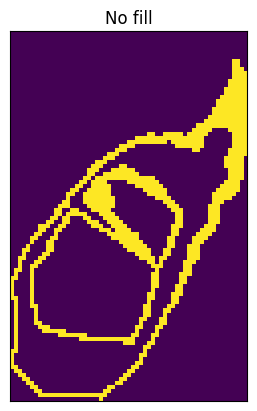

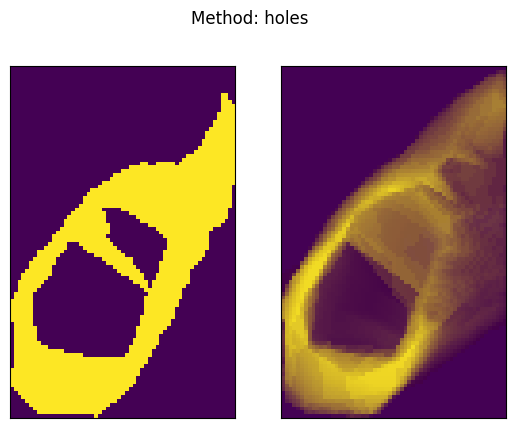

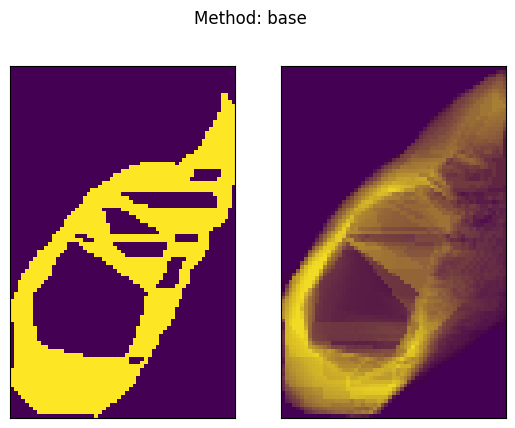

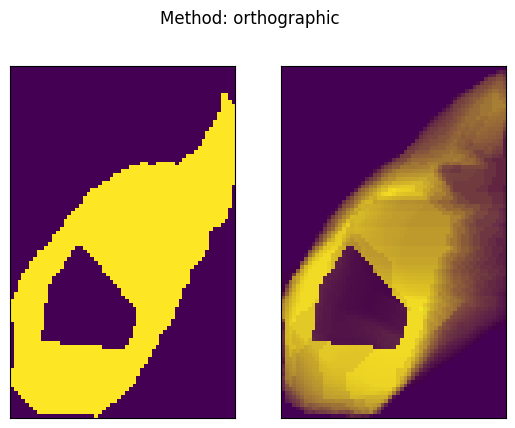

In [196]:
## Different methods for filling the voxel grid
img = voxelized.matrix*1

section = int(img.shape[0]*.94)

plt.imshow(img[section,:,:])
plt.xticks([])
plt.yticks([])
plt.title('No fill')
plt.show()

for method in ['holes', 'base', 'orthographic']:
    test = voxelized.copy()
    test = test.fill(method=method)
    img = test.matrix*1

    fig, ax = plt.subplots(1,2)
    plt.suptitle('Method: ' + method)
    ax[0].imshow(img[section,:,:])
    for j in range(img.shape[0]):
        ax[1].imshow(img[j, :, :], alpha=.08)
    for i in range(2):
        ax[i].set_xticks([])
        ax[i].set_yticks([])
    plt.show()

In [142]:
## Skeletonize
voxelized = voxelized.fill(method='holes')
img = voxelized.matrix*1
skeleton = skeletonize(img).astype(int) # for 3D, uses method='lee'

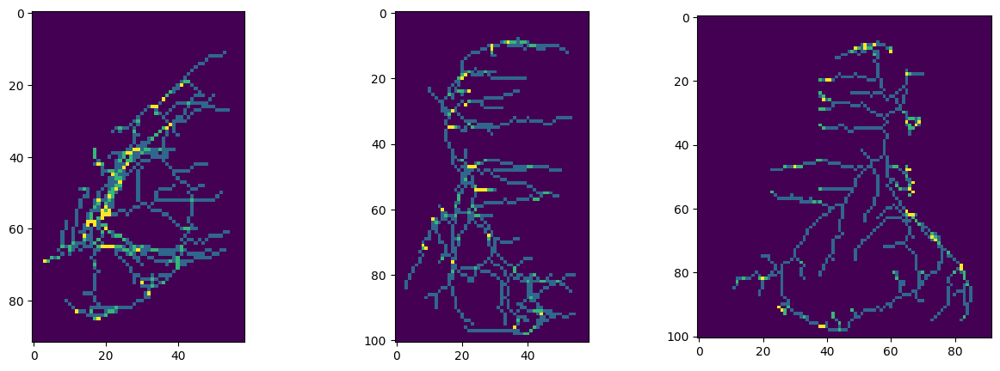

In [143]:
## Visualize skeleton (unpruned)
fig, ax = plt.subplots(1,3, figsize=(15,5))
for i in range(3):
    ax[i].imshow( np.clip( skeleton.sum(i), 0, 3) ) # set max val to limit perceived depth
plt.show()

In [148]:
# Build graph from skeleton
graph = sknw.build_sknw(skeleton.astype(np.uint16))
graph = graph.to_undirected()

# Find longest path (acyclic)
longest_path, _ = _find_longest_simple_path(graph)
longest_path_nodes = set(longest_path)

# Prune 'spurious' branches while protecting the longest path
# Note: This will not remove branches that are part of cycles
total_length = np.sum(list(nx.get_edge_attributes(graph, "weight").values())) # unpruned
pruned_graph = _prune_graph(graph, total_length, longest_path_nodes, min_ratio=.05)

# Compute the linearity score: longest path length / total length of the pruned graph
path_length = nx.path_weight(pruned_graph, longest_path, weight="weight")
total_length = np.sum(list(nx.get_edge_attributes(pruned_graph, "weight").values())) # pruned

print(f'Linearity: { path_length / total_length :.2f}' )

Linearity: 0.98


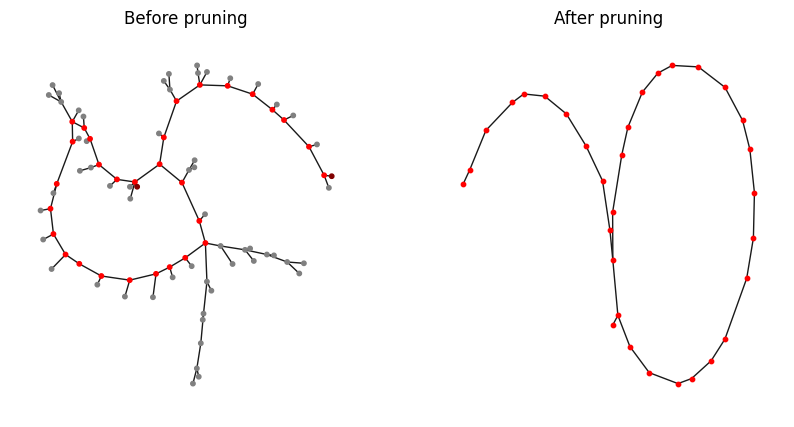

In [151]:
## Plot graph before and after pruning
colors = np.repeat('grey', np.array(graph.nodes).size).astype('<U10')
colors[ np.array(pruned_graph.nodes) ] = 'green' # not in longest path, but not removed
colors[ np.array(longest_path) ] = 'red' # in longest path
colors[ np.array([longest_path[0], longest_path[-1]]) ] = 'maroon' # first & last nodes of longest path

fig, ax = plt.subplots(1,2, figsize=(10,5))
nx.draw(graph, pos=nx.spring_layout(graph, seed=68), ax=ax[0],
        node_size=10, node_color=colors)
nx.draw(pruned_graph, pos=nx.spring_layout(pruned_graph, seed=2), ax=ax[1],
        node_size=10, node_color='red')
ax[0].set_title('Before pruning')
ax[1].set_title('After pruning')
plt.show()

**Curl**:
"Curl measures how twisted or curved a cluster is. It is computed as one minus the ratio between the major axis of the minimum rotated rectangle that fits the polygon and the fiber length. Circular and irregular clusters exhibit a high curl." ([Varrone et al., 2023](https://www.nature.com/articles/s41588-023-01588-4)), calculated as 

$curl = 1 - \frac{s}{L}$

with the major axis length $s$ and the fiber length $L$.

For 2D shapes, $L$ is defined as $L = \frac{4A}{p - \sqrt{p^2 - 16A}}$.
Intuitively, this measure compares the shape with an equivalent rectangle with the same area $A$ and perimeter $p$.

The closest equivalent to this in 3D is to compare the shape with an equivalent cylinder (or cuboid) of the same surface area and volume. I implemented this as the method `shape_comparison`. 
However, this method often returns `None` on our data, in most cases because $L < s$ (not shown), meaning that the shapes cannot be meaningfully approximated as either cylinders or cuboids.

An alternative method to define the fiber length is via the skeletonized image, as for the linearity score. This is provided with the method option `skeleton`.
While this method, when used on our dataset, more often returns values other than `None`, the approach is much more complex and therefore not as easily interpretable. Thus, both methods are provided.

Here is an idealized example, returning a high curl score:

Curl: 0.99


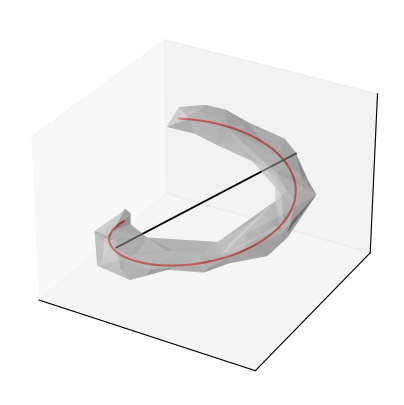

In [167]:
## Exemplify curl
# Generate toy data
n = 50
m = 3
rng = np.random.default_rng(42)
theta = np.linspace(0, 1.75*np.pi, n)
z = np.linspace(0, 1, n)
x = np.cos(theta + np.pi)
y = np.sin(theta + np.pi)
x1 = np.tile(x, m) + rng.normal(0, 0.1, n*m)
y1 = np.tile(y, m) + rng.normal(0, 0.1, n*m)
z1 = np.tile(z, m) + rng.normal(0, 0.1, n*m)

# Create mesh
mesh = alphashape.alphashape(np.vstack([x1, y1, z1]).T, alpha=1.5)

# Get major axis
bbox = mesh.bounding_box_oriented
lbf, lbb, ltf, ltb, rbf, rbb, rtf, rtb = bbox.vertices
x_min = lbf[0] - (lbf[0]-rbf[0])/2
x_max = ltf[0] - (ltf[0]-rtf[0])/2
y_min = lbf[1] - (lbf[1]-lbb[1])/2
y_max = ltf[1] - (ltf[1]-ltb[1])/2
z_min = bbox.vertices.min(0)[2]
z_max = bbox.vertices.max(0)[2]

# Calculate curl
print(f'Curl: {_curl_3D_skeleton(mesh):.2f}')

# Plot
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(projection='3d')
#ax.view_init(elev=70, azim=70, roll=50)

ax.plot_trisurf(mesh.vertices[:, 0], mesh.vertices[:,1], mesh.vertices[:,2],
                triangles=mesh.faces, alpha=.4, color='lightgray') # mesh
ax.plot(x, y, z,
        linewidth=1.5, color='red') # fiber
ax.plot([x_min, x_max], [y_min, y_max], [z_min, z_max],
        linewidth=1.3, color='black') # major axis

ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])

#plt.savefig('../../figures/shape_curl.svg', bbox_inches='tight')
plt.show()

#### Run shape characterization on whole 3D dataset

In [199]:
## Load full 3D dataset
# assigned niches as in niches_cellcharter.ipynb
adata3_full = ad.read_zarr("../../data/temp/Kuett_2022_cellcharter_3D_full.zarr")
adata3 = ad.AnnData(
    obs = adata3_full.obs[['id','ct_broad','imageid', 'cluster_k4']].rename(
        columns={'ct_broad':'phenotype','imageid':'sample', 'cluster_k4':'niche'}),
    obsm = {'spatial': adata3_full.obsm['spatial']},
    obsp = {'spatial_connectivities': adata3_full.obsp['spatial_connectivities']}
)
adata3.obs.niche = adata3.obs.niche.map({0:0,1:3,2:2,3:1}).astype('category')

In [200]:
## Identify connected components in all 3D data
t0 = time.process_time()
cc.gr.connected_components(adata3, cluster_key='niche', min_cells=30)
print("Time elapsed: ", time.strftime('%H:%M:%S', time.gmtime(int(time.process_time()-t0))) )

Time elapsed:  00:00:00


In [201]:
## Compute alpha shape
t0 = time.process_time()
cc.tl.boundaries(adata3, alpha_start=30)
print("Time elapsed: ", time.strftime('%H:%M:%S', time.gmtime(int(time.process_time()-t0))) )

Time elapsed:  00:00:00


In [208]:
## Assess shape features
t0 = time.process_time()
cc.tl.purity(adata3)
cc.tl.linearity(adata3)
cc.tl.flatness(adata3)
cc.tl.elongation(adata3)
cc.tl.sphericity(adata3)
cc.tl.curl(adata3)
print("Time elapsed: ", time.strftime('%H:%M:%S', time.gmtime(int(time.process_time()-t0))) )

Time elapsed:  00:03:10


In [209]:
## Get index of shape with min/max score
keys = list( adata3.uns['shape_component']['elongation'].keys() )
for score in shape_features:
    min_key = keys[ np.argmin([ adata3.uns['shape_component'][score][key] for key in keys ]) ]
    min_value = adata3.uns['shape_component'][score][min_key]
    min_value = np.round(min_value,2)
    max_key = keys[ np.argmax([ adata3.uns['shape_component'][score][key] for key in keys ]) ]
    max_value = adata3.uns['shape_component'][score][max_key]
    max_value = np.round(max_value,2)

    print(f'{score}:\tmin = {min_value} (shape {min_key}),\tmax = {max_value} (shape {max_key})')

purity:	min = 0.05 (shape 20),	max = 1.0 (shape 10)
linearity:	min = 0.44 (shape 22),	max = 1.0 (shape 11)
elongation:	min = 0.03 (shape 0),	max = 0.78 (shape 10)
curl:	min = 0.0 (shape 11),	max = 0.54 (shape 16)


In [211]:
## Visualize exemplary shapes
mesh = adata3.uns['shape_component']['boundary'][11]
mesh.show()

In [213]:
## Shape features to df
keys = adata3.uns['shape_component']['boundary'].keys()
shape_features = [ key for key in adata3.uns['shape_component'].keys() if not key=='boundary']
#shape_features = ['purity','linearity','flatness','elongation','sphericity','curl']

shape_df = pd.DataFrame(index=keys)
for score in shape_features:
    shape_df[score] = [ adata3.uns['shape_component'][score][key] for key in keys ]

shape_df_zscore = ( shape_df[shape_features] - shape_df[shape_features].mean(0) ) / shape_df[shape_features].std(0)

niche = pd.Series([adata3.obs.iloc[np.argwhere(adata3.obs['component'] == i)[0][0], :]['niche']
                   for i in shape_df.index], index=shape_df.index, name='niche')
shape_df_zscore['niche'] = niche

shape_df_zscore

,purity,linearity,flatness,elongation,sphericity,curl,niche
23,-0.295764,0.970036,1.548305,1.548239,-1.436786,0.699311,1
8,-0.027823,-1.541153,-1.664734,-0.343734,0.729184,1.383072,2
14,-1.102693,-1.044487,0.382549,0.470207,-0.145584,1.080170,2
11,-0.082169,1.394967,-0.945047,-0.575002,1.533706,-0.771595,2
13,1.789710,0.021124,-0.627973,1.225096,0.805744,-0.105789,2
15,-0.737578,-1.159033,-1.662313,-0.795164,-0.911072,1.521627,2
16,0.299266,-0.995373,0.346799,0.379746,-0.437541,2.058938,2
17,0.003008,-0.856509,-0.629893,-0.671164,0.964929,0.946910,2
19,-0.925999,0.172542,-1.066413,0.706642,0.272342,0.889147,2
12,-0.401359,-0.560714,0.709453,-1.382359,1.284711,-0.771595,2


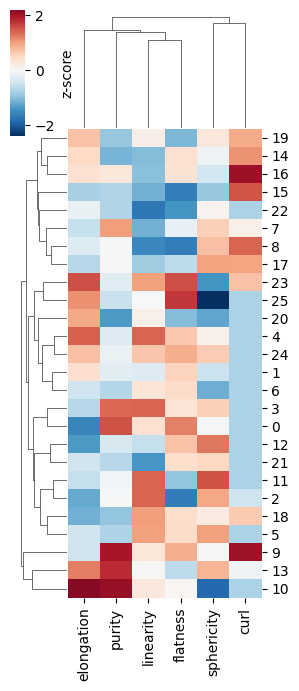

In [214]:
## Heatmap z-scores
sns.clustermap(shape_df_zscore[shape_features],
               figsize=(3, 7),
               cmap='RdBu_r',
               center=0,
               cbar_kws={'label': 'z-score', 'fraction':0.5})
plt.show()

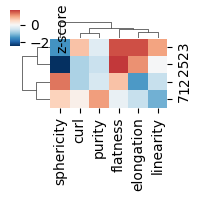

In [ ]:
## Heatmap z-scores of selected shapes
selection = [23,12,7, 25]
sns.clustermap(shape_df_zscore.loc[selection, ['sphericity','flatness','elongation','linearity','curl','purity']],
               figsize=(2, 2),
               cmap='RdBu_r',
               center=0,
               cbar_kws={'label': 'z-score', 'fraction':0.5})
#plt.savefig('../../figures/shape_features_exemplary_heatmap.svg', bbox_inches='tight')
plt.show()

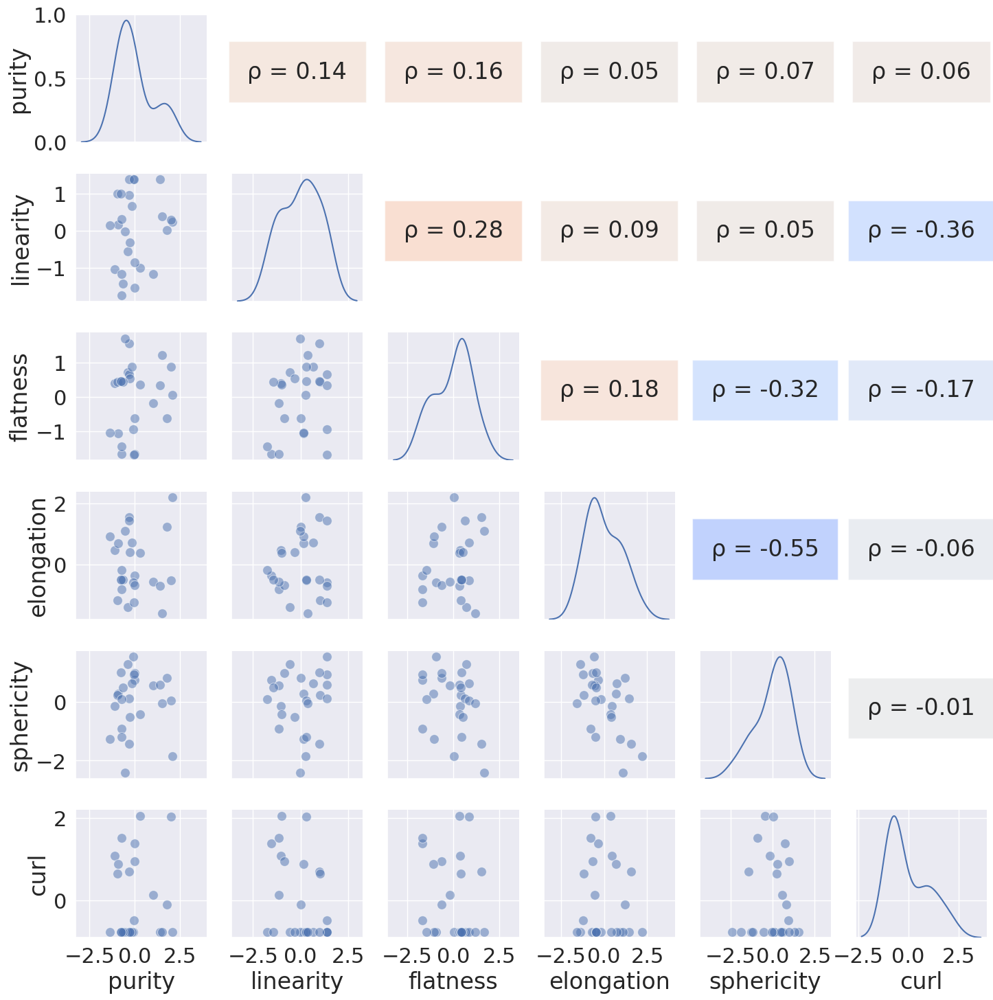

In [217]:
# Feature correlation
def corrfunc(x, y, cmap, **kws):
    r, _ = pearsonr(x, y)
    ax = plt.gca()
    norm = plt.Normalize(-1, 1)
    ax.annotate("ρ = {:.2f}".format(r),
                xy=(0.5, 0.5), xycoords='axes fraction', ha='center',
                bbox={'facecolor': cmap(norm(r)), 'alpha': 0.5, 'pad': 20},
                )
    ax.set_axis_off()
cmap = plt.get_cmap('coolwarm')

sns.set(font_scale=2)
pg = sns.PairGrid(shape_df_zscore.drop('niche', axis=1),
                  diag_sharey=False)
pg.map_upper(corrfunc, cmap=cmap)
pg.map_lower(sns.scatterplot, s=100, alpha=.5)
pg.map_diag(sns.kdeplot)
plt.show()
sns.reset_defaults()

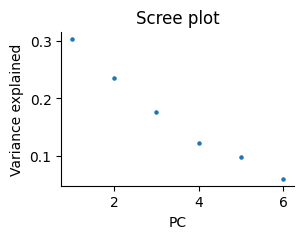

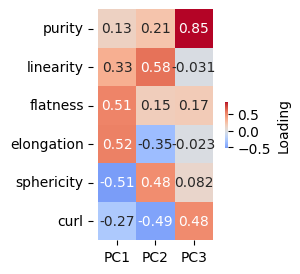

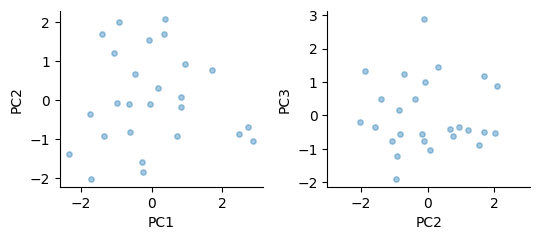

In [226]:
## PCA
# Scale (mean to center, unit variance)
shape_df_scaled = pd.DataFrame(scale(shape_df[shape_features]), columns=shape_features, index=shape_df.index)

# PCA
pca = PCA(n_components=len(shape_features), random_state=42).fit(shape_df_scaled)
shape_pca = pca.transform(shape_df_scaled)

# Scree plot
plt.subplots(figsize=(3,2))
plt.scatter(np.arange(1, len(shape_features)+1), pca.explained_variance_ratio_, s=5)
plt.ylabel('Variance explained')
plt.xlabel('PC')
plt.title('Scree plot')
sns.despine(top=True, right=True)
plt.show()

# Feature loadings
n_pcs = 3
loadings = pd.DataFrame(pca.components_[:n_pcs,:].T,
                        columns=[f'PC{i+1}' for i in range(n_pcs)], index=shape_features
                        )
plt.subplots(figsize=(2, 3))
sns.heatmap(loadings, cmap='coolwarm', center=0, annot=True,
            cbar_kws={'label':'Loading', 'shrink':.2})
plt.axis('equal')
plt.show()

# Plot first three PCs
fig, ax = plt.subplots(1,2, figsize=(5.5, 2.5), layout='tight')
for i in range(2):
    ax[i].scatter(shape_pca[:, i],
                shape_pca[:, i+1],
                s=15, alpha=.4)
    ax[i].set_xlabel(f'PC{i+1}')
    ax[i].set_ylabel(f'PC{i+2}')
plt.axis('equal')
sns.despine(top=True, right=True)
plt.show()

In [ ]:
## Save environment specs
!pip freeze > ../../environment/shape_features.txt

0